In [1]:
import sys
import os
path = r'D:\Documenten\Thesis'
os.chdir(path)

In [2]:
import pandas as pd
import pylab as pl
import matplotlib.pyplot as plt
import numpy as np
pl.rcParams['axes.grid'] = True
np.random.seed(0)
import seaborn as sns

import pylab
import matplotlib
%matplotlib inline

In [3]:
import glob
sns.set(style="whitegrid")

# Focus on tracks: speed and directionality

In [4]:
#file MDS data zoeken
rootdir = 'MDS data'
tracks_data = glob.glob(os.path.join(path, rootdir))
print(tracks_data[0]) #anders maakt hij er een lijst van


D:\Documenten\Thesis\MDS data


In [5]:
list_ = []
#2 for loops: een voor elke patiëntenfile (9 in totaal) en een voor elk excelbestand per file (dus elke treatment)
#in de for loop twee kolommen toevoegen: een voor status en een met de treatments (startswith 1 = controle)

for subdir, dirs, files in os.walk(rootdir): #iterates over descendant files in rootdirectory
    print(subdir)
    print(dirs)
    print(files)
    for foldername in dirs:
        print(rootdir+"\\"+foldername)
        for subdir, dirs, files in os.walk(rootdir+"\\"+foldername):
            for filename in files:
                print(rootdir+"\\"+foldername+"\\"+filename)
                df = pd.read_csv(rootdir+"\\"+foldername+"\\"+filename,index_col=None, sep=';')
                df['treatment'] = [filename[:-4]]*len(df)
                df['status'] = [("control" if foldername.startswith("1")
                           else "mild" if foldername.startswith("8")
                           else "severe")]*len(df)
                df['patientnumber'] = foldername
                list_.append(df)

MDS data
['122', '129', '164', '714', '722', '751', '805', '858', '859']
[]
MDS data\122
MDS data\122\CXCL1.csv
MDS data\122\CXCL8.csv
MDS data\122\fMLP.csv
MDS data\122\PBS.csv
MDS data\129
MDS data\129\CXCL1.csv
MDS data\129\CXCL8.csv
MDS data\129\fMLP.csv
MDS data\129\PBS.csv
MDS data\164
MDS data\164\CXCL1.csv
MDS data\164\CXCL8.csv
MDS data\164\fMLP.csv
MDS data\164\PBS.csv
MDS data\714
MDS data\714\CXCL1.csv
MDS data\714\CXCL8.csv
MDS data\714\fMLP.csv
MDS data\714\PBS.csv
MDS data\722
MDS data\722\CXCL1.csv
MDS data\722\CXCL8.csv
MDS data\722\fMLP.csv
MDS data\722\PBS.csv
MDS data\751
MDS data\751\CXCL1.csv
MDS data\751\CXCL8.csv
MDS data\751\fMLP.csv
MDS data\751\PBS.csv
MDS data\805
MDS data\805\CXCL1.csv
MDS data\805\CXCL8.csv
MDS data\805\fMLP.csv
MDS data\805\PBS.csv
MDS data\858
MDS data\858\CXCL1.csv
MDS data\858\CXCL8.csv
MDS data\858\fMLP.csv
MDS data\858\PBS.csv
MDS data\859
MDS data\859\CXCL1.csv
MDS data\859\CXCL8.csv
MDS data\859\fMLP.csv
MDS data\859\PBS.csv
MDS da

In [6]:
dftracks = pd.concat(list_, sort=True)
dftracks = dftracks.drop("Line", axis = 1)
dftracks.rename(columns={'Track N': 'Track_N','Time Sample N' : 'Time_Sample_N'}, inplace=True) #inplace: changes original dataframe instead of creating a copy
dftracks

,Time_Sample_N,Track_N,X,Y,patientnumber,status,treatment
0,1,1,88,780,122,control,CXCL1
1,2,1,92,776,122,control,CXCL1
2,3,1,92,780,122,control,CXCL1
3,4,1,104,764,122,control,CXCL1
4,5,1,100,768,122,control,CXCL1
5,6,1,104,764,122,control,CXCL1
6,7,1,104,768,122,control,CXCL1
7,8,1,104,772,122,control,CXCL1
8,9,1,112,764,122,control,CXCL1
9,10,1,112,764,122,control,CXCL1


In [7]:
print("number of time points: {}".format(len(dftracks.Time_Sample_N.unique())))
print("number of tracks: {}".format(len(dftracks.Track_N.unique())))

number of time points: 479
number of tracks: 29120


# Tracks per patient and per treatment

Patient 122 (controle)

Text(0.5,0.98,'Tracks per condition type')

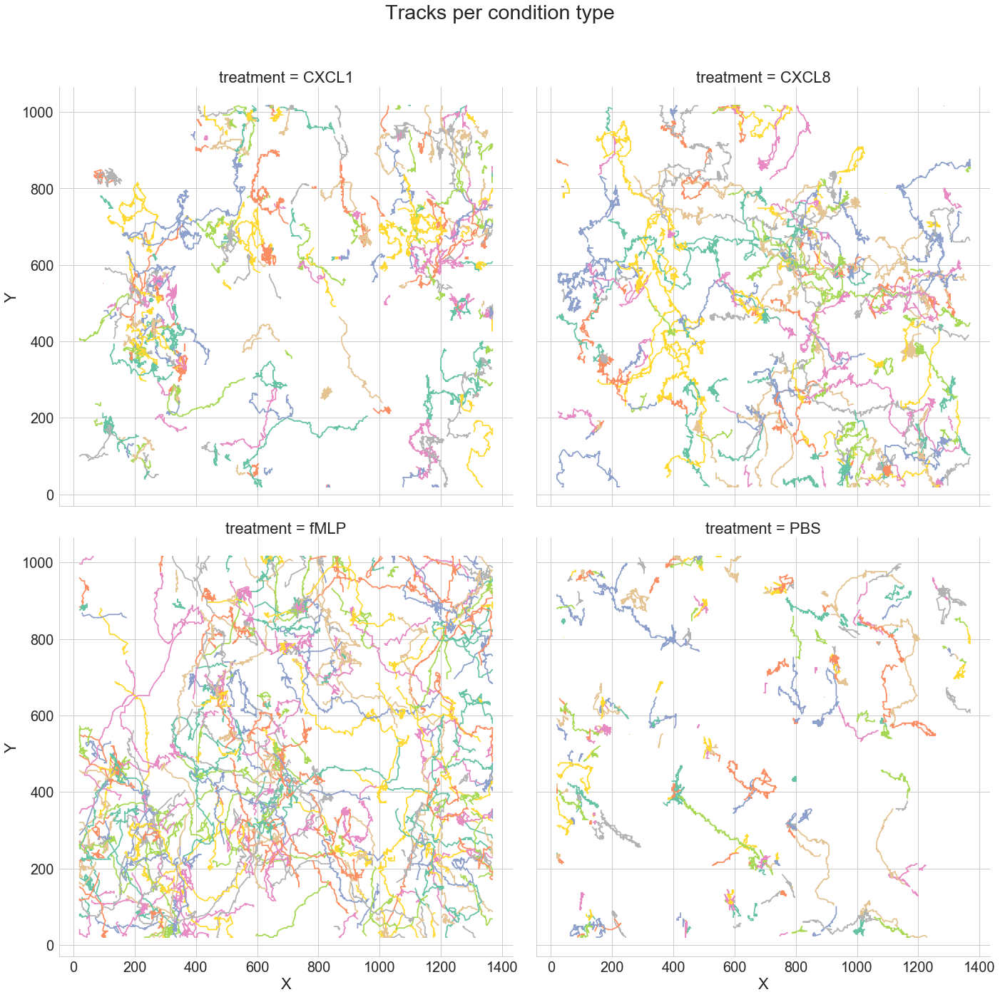

In [53]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="122"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

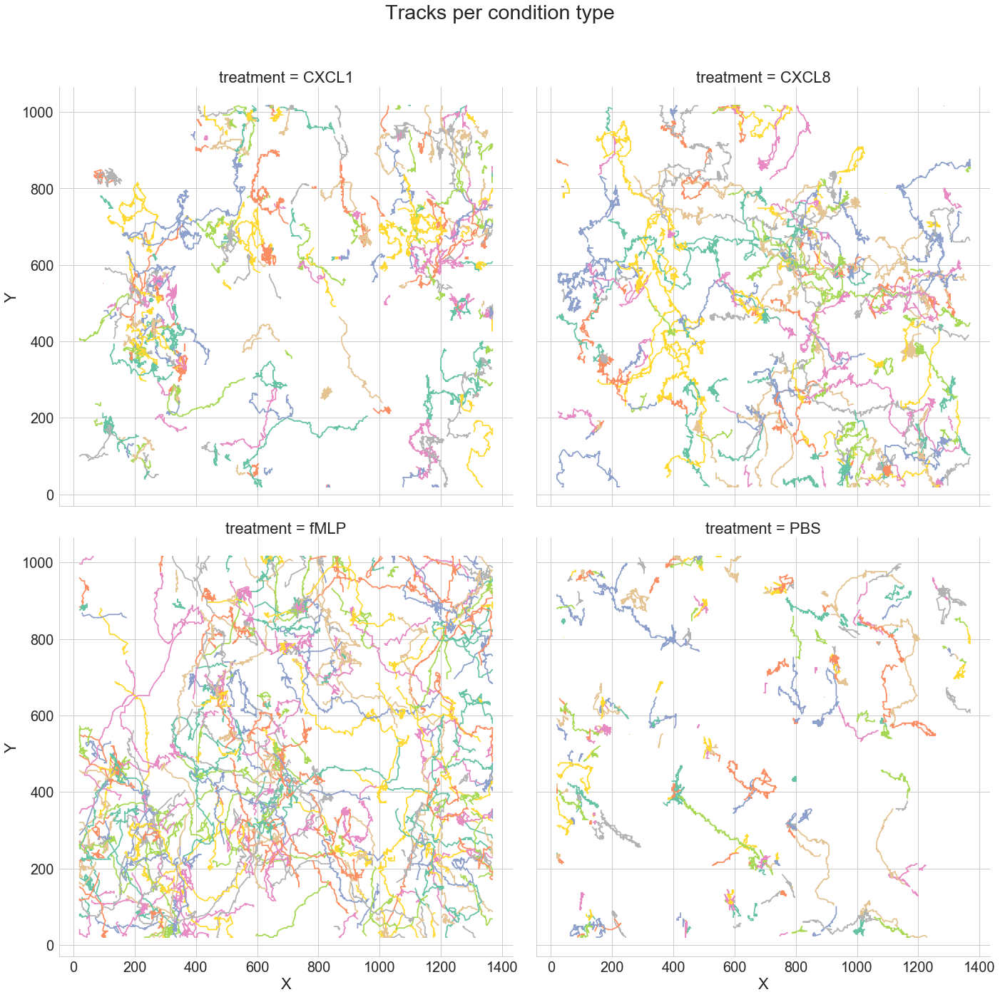

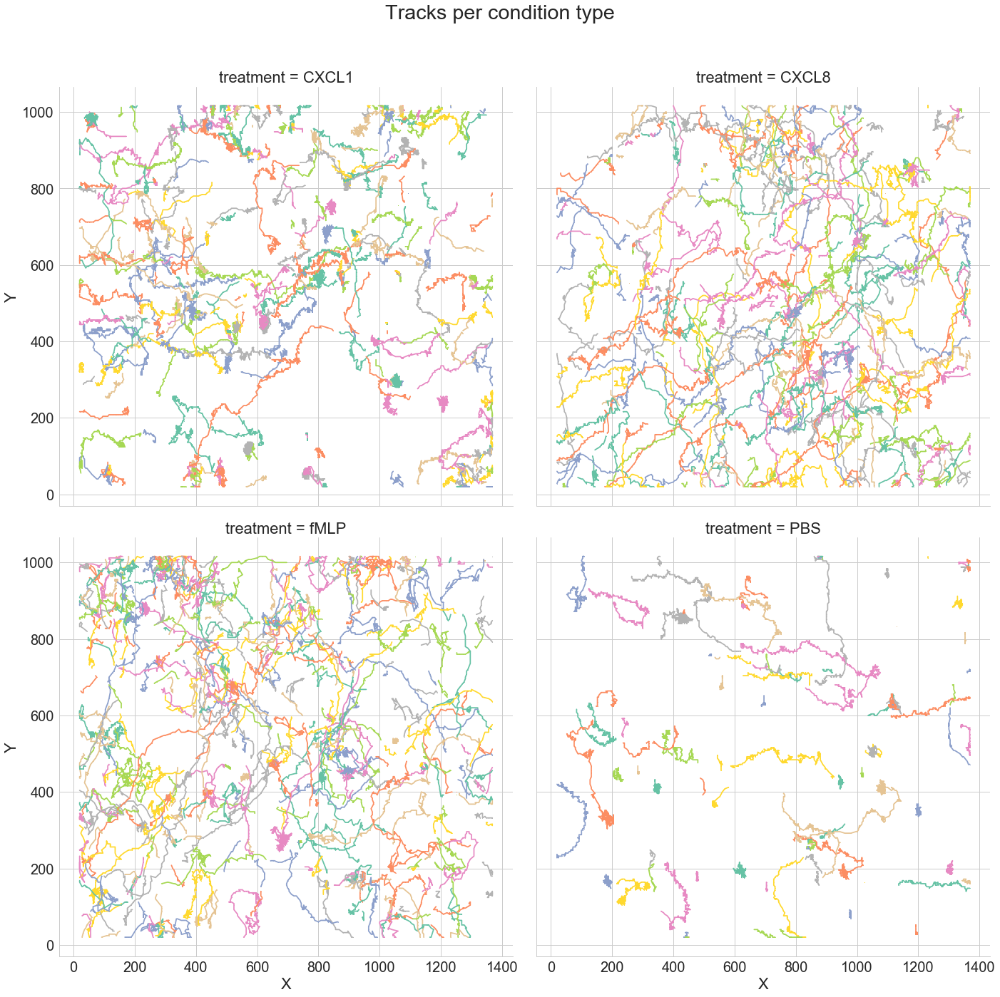

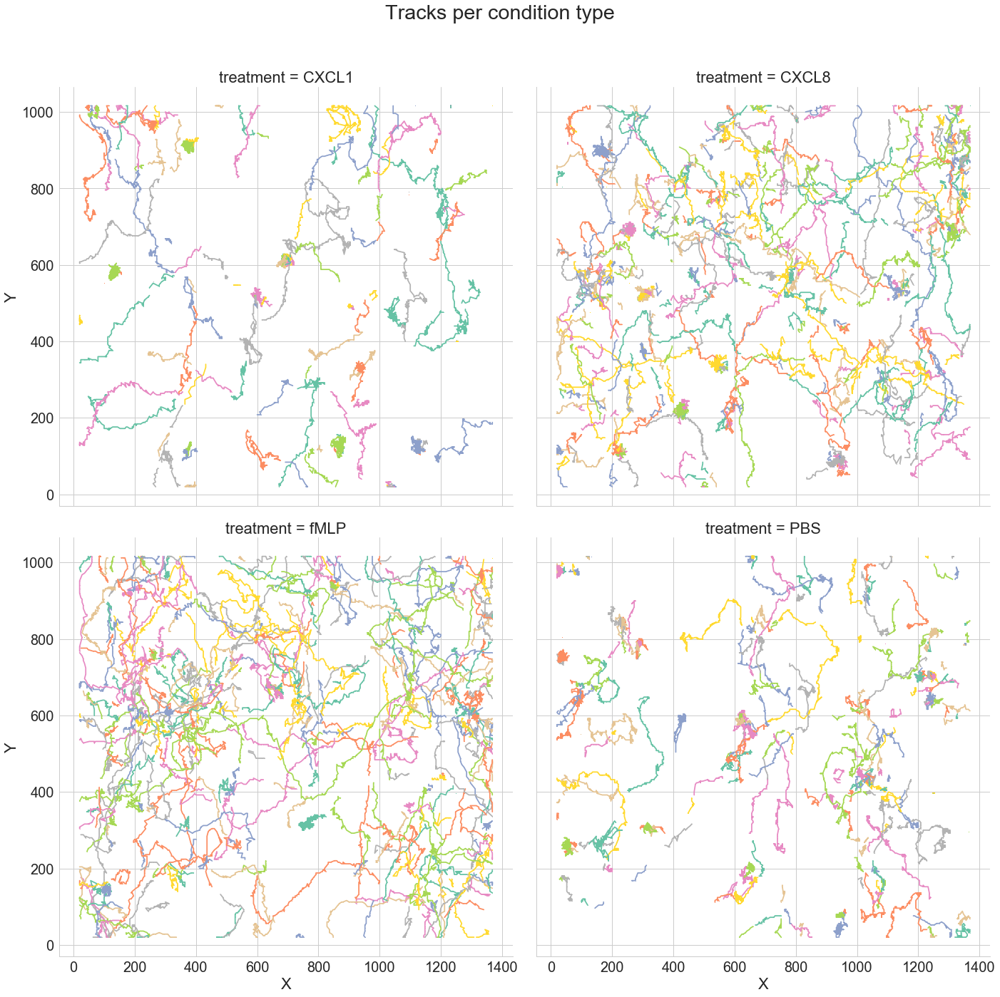

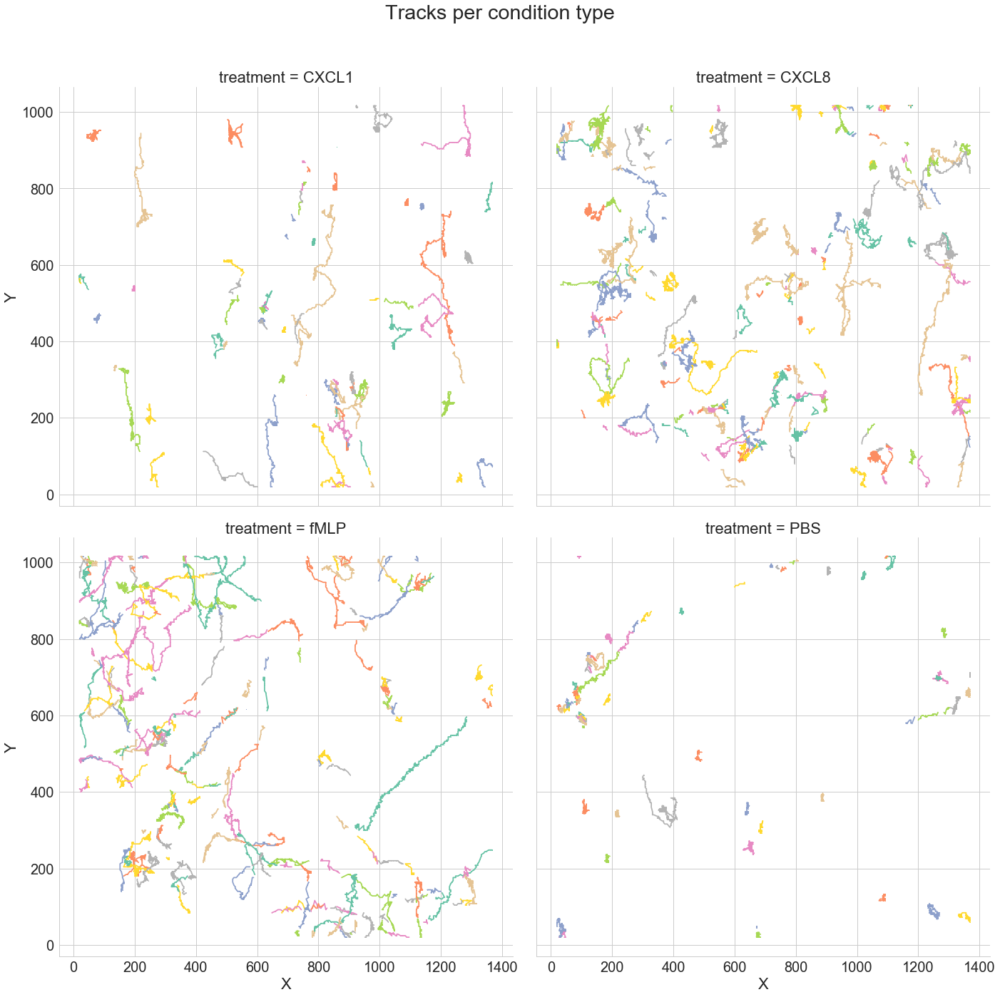

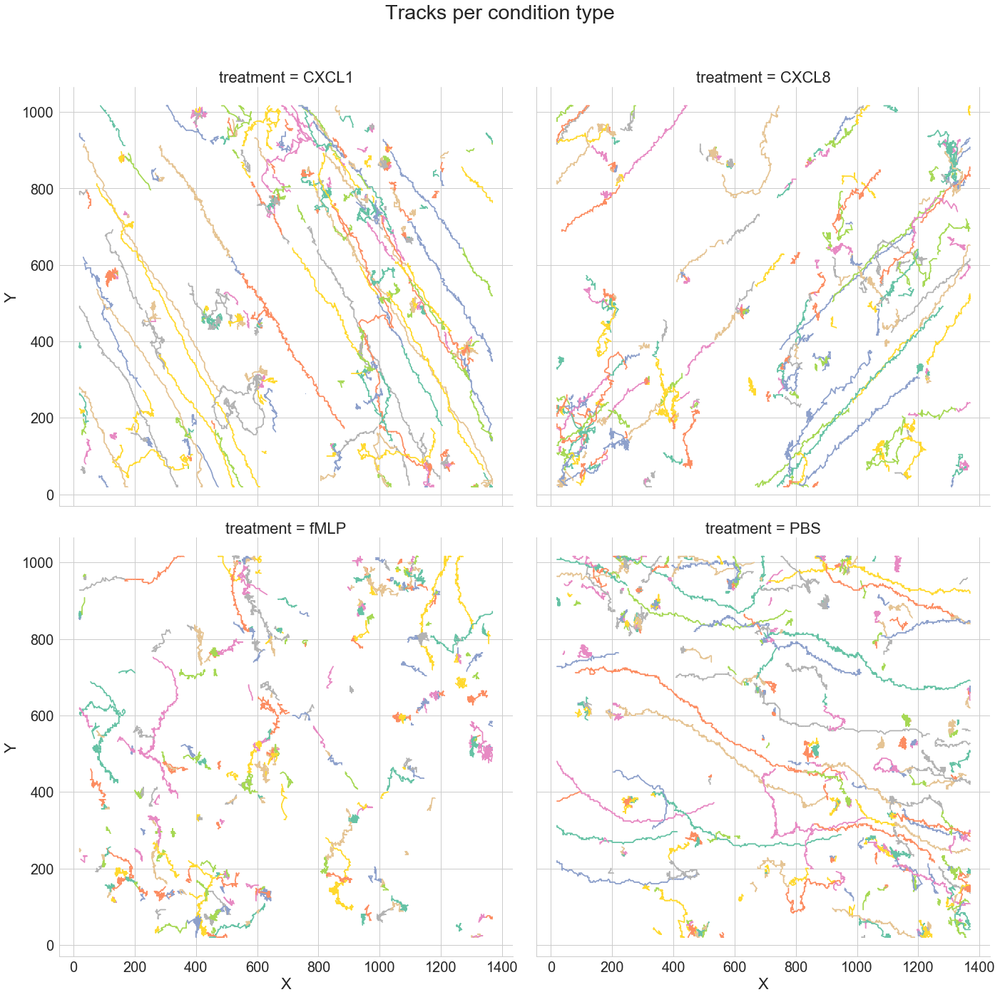

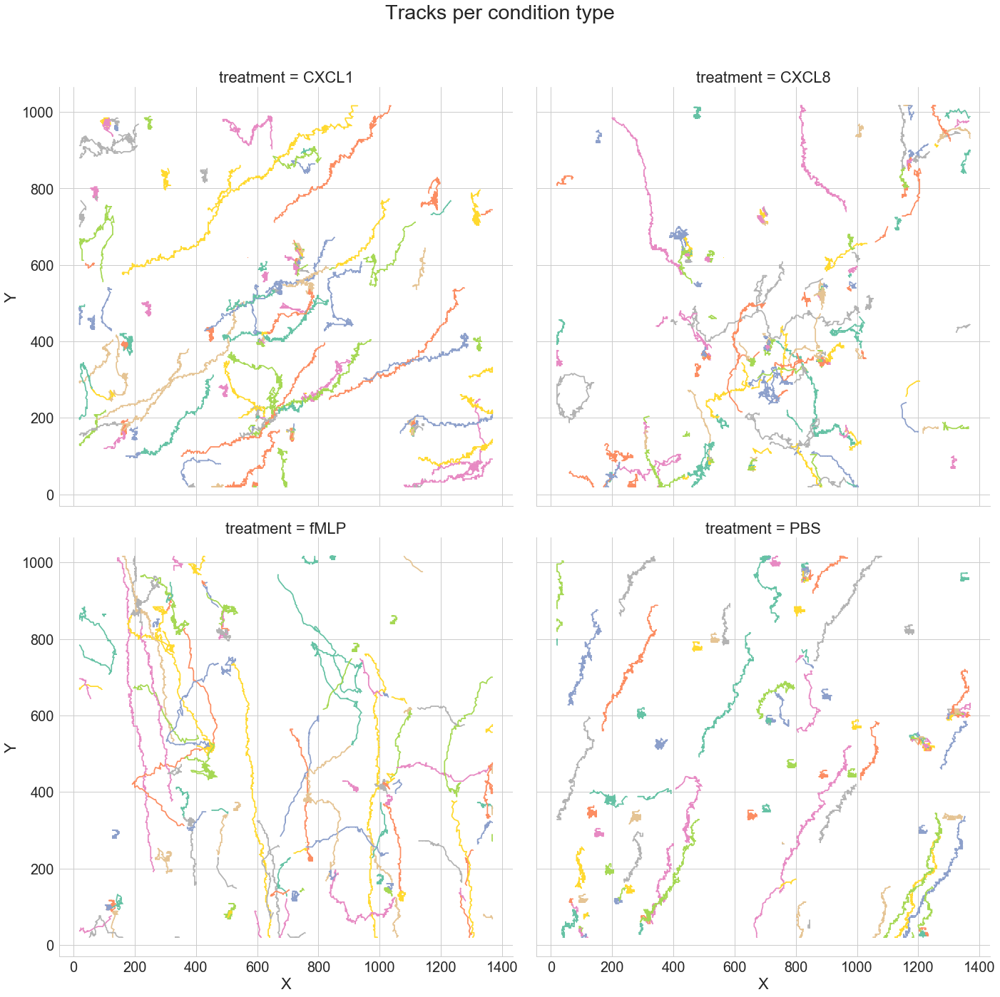

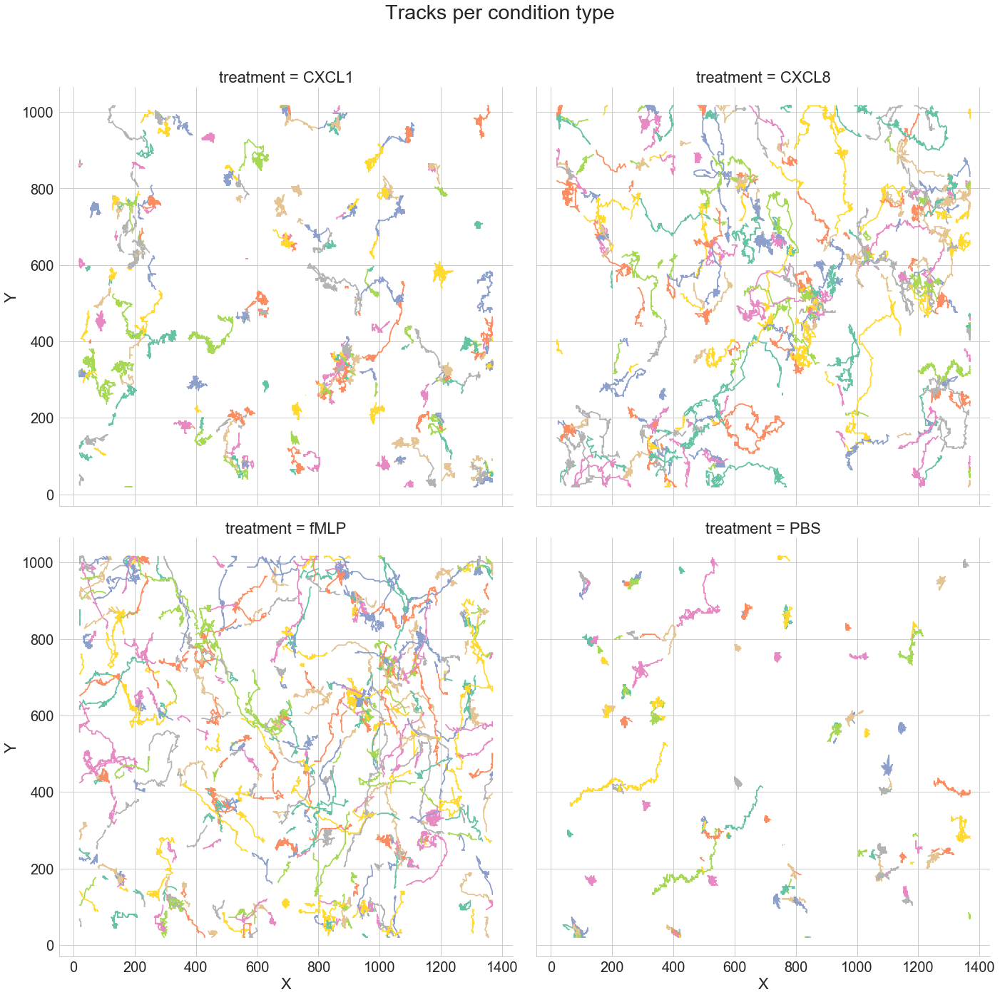

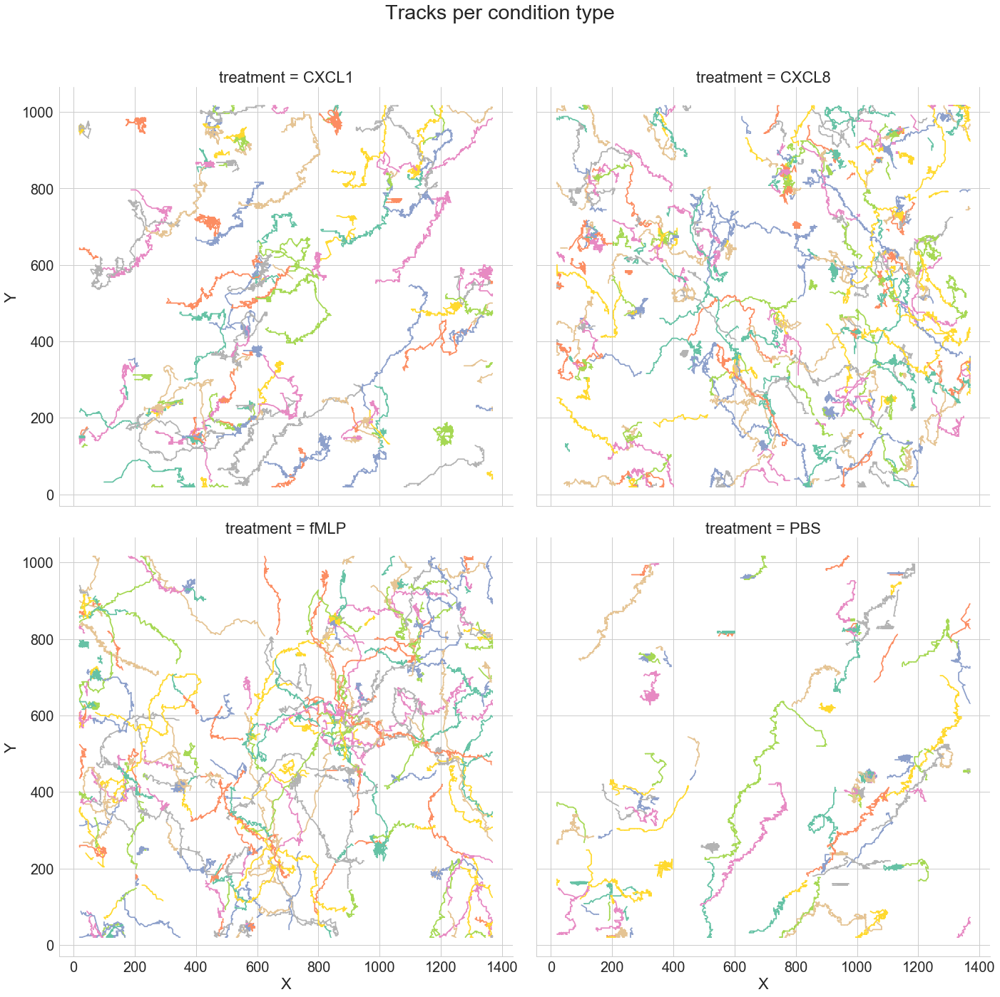

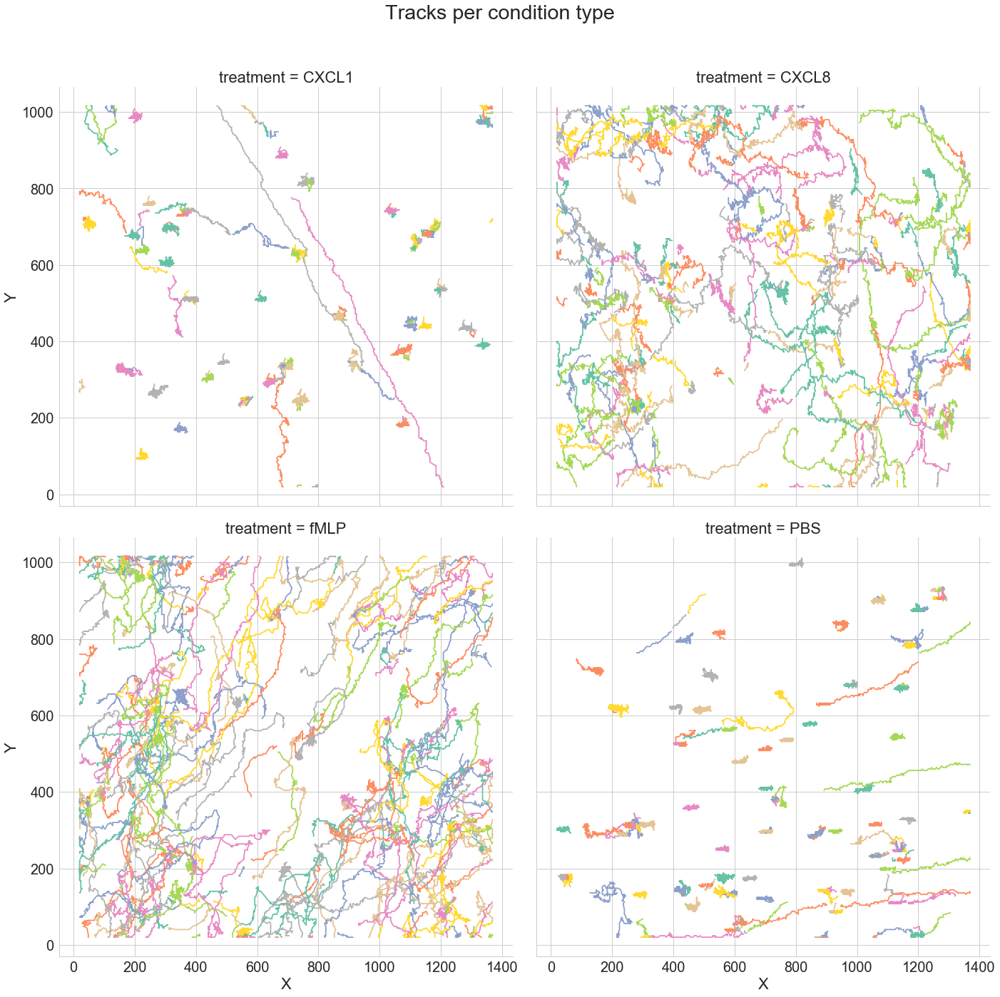

In [39]:

for element in dftracks.patientnumber.unique():
    #element = int(element)
    sns.set(style="whitegrid", font_scale=2)
    grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]==element], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
    grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
    plt.subplots_adjust(top=0.9)
    grid.fig.suptitle('Tracks per condition type')

Patient 129 (controle)

Text(0.5,0.98,'Tracks per condition type')

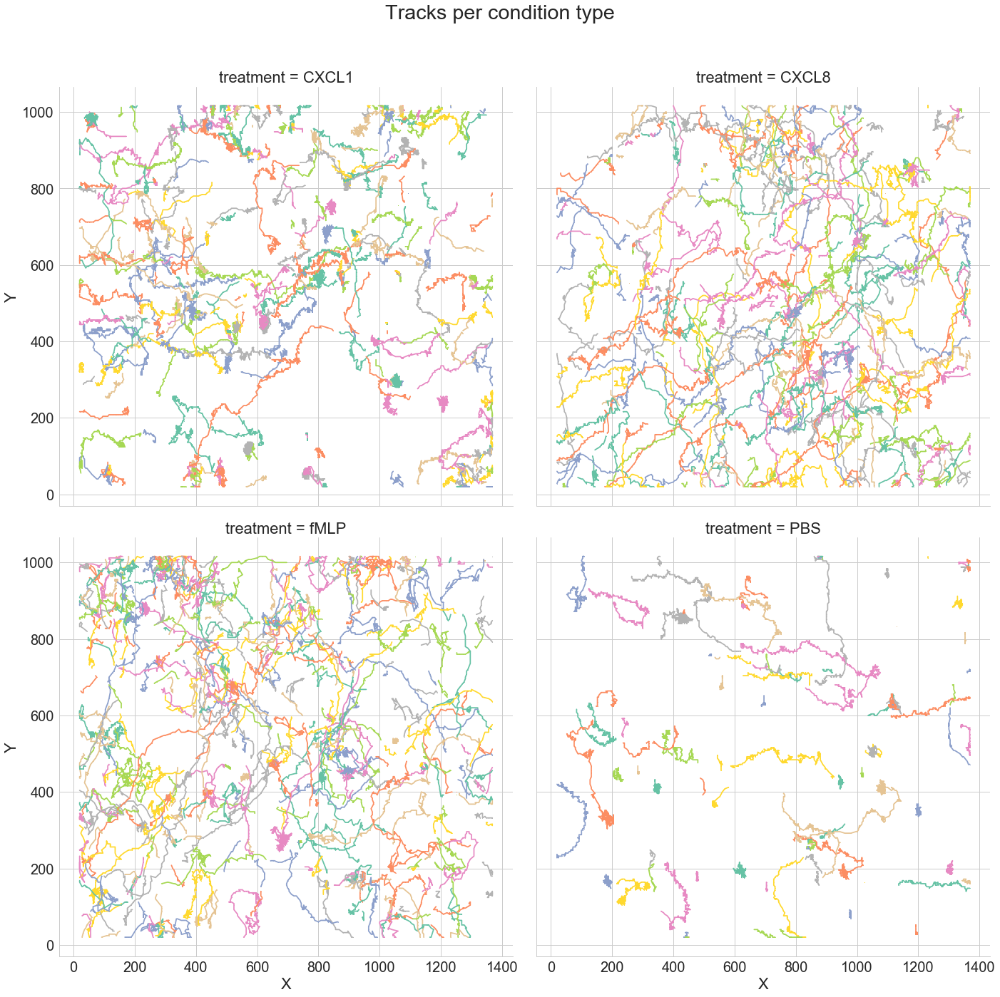

In [52]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="129"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

Patient 164 (controle)

Text(0.5,0.98,'Tracks per condition type')

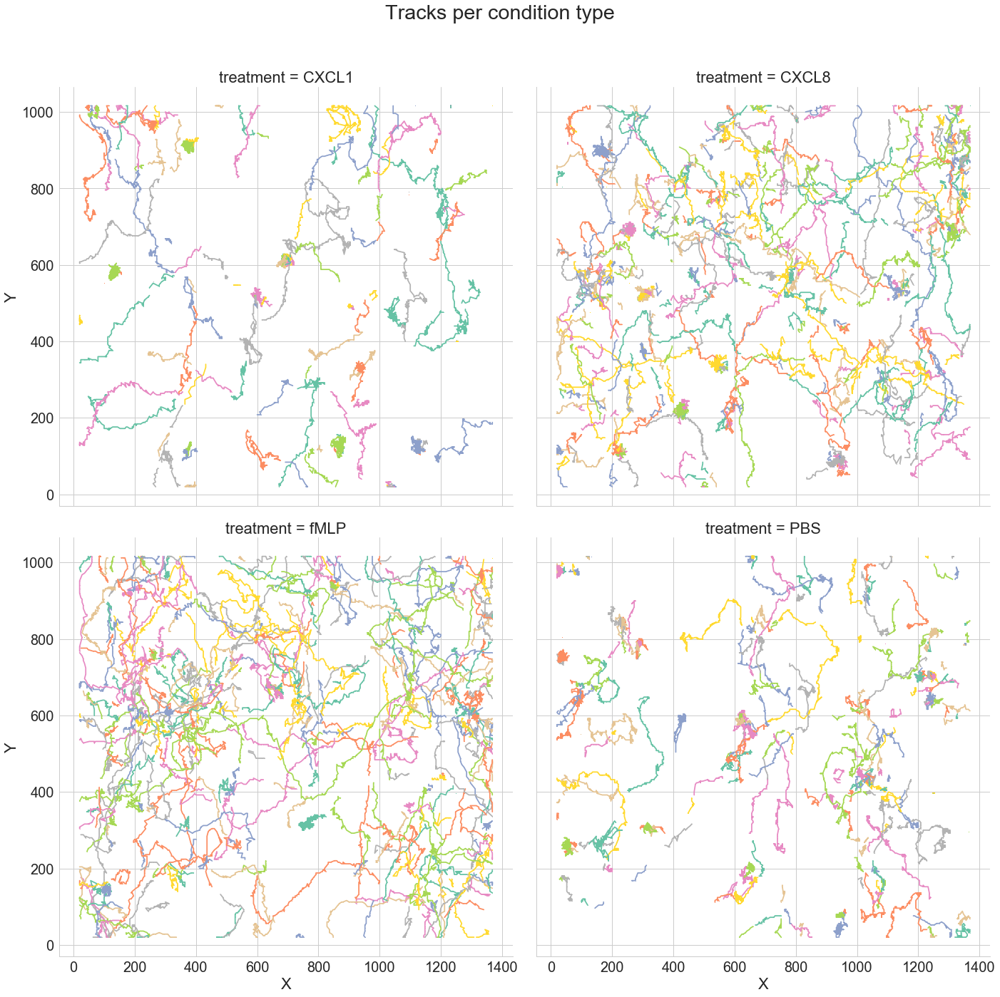

In [51]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="164"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

Patient 714 (severe)

Text(0.5,0.98,'Tracks per condition type')

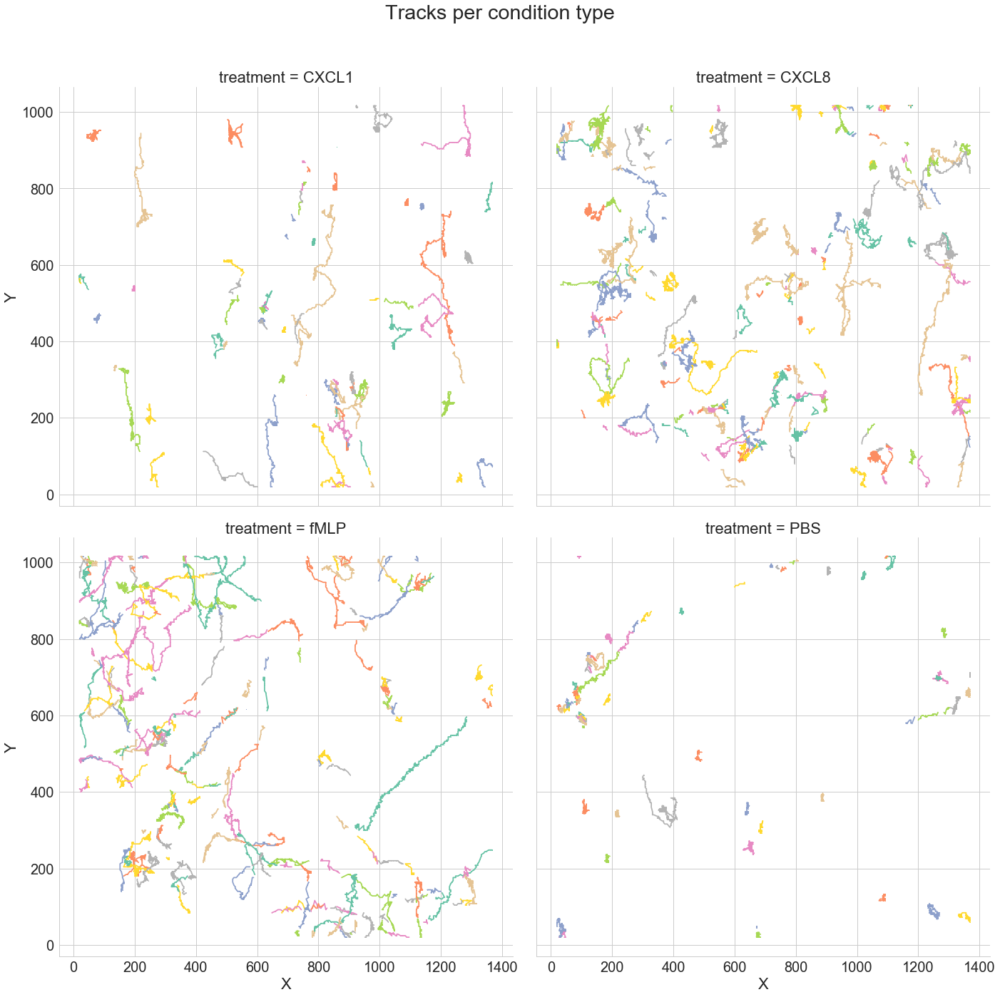

In [49]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="714"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

Patient 722 (severe)

Text(0.5,0.98,'Tracks per condition type')

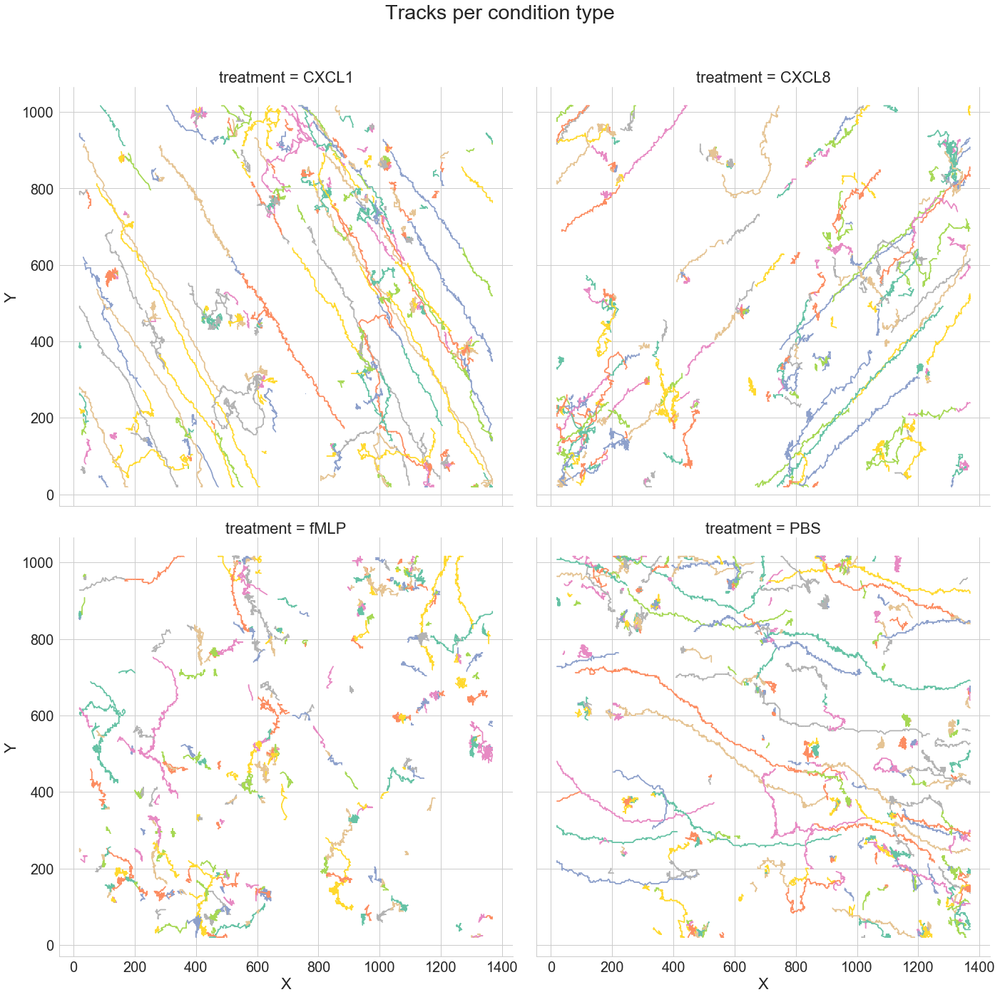

In [38]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="722"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

Patient 751 (severe)

Text(0.5,0.98,'Tracks per condition type')

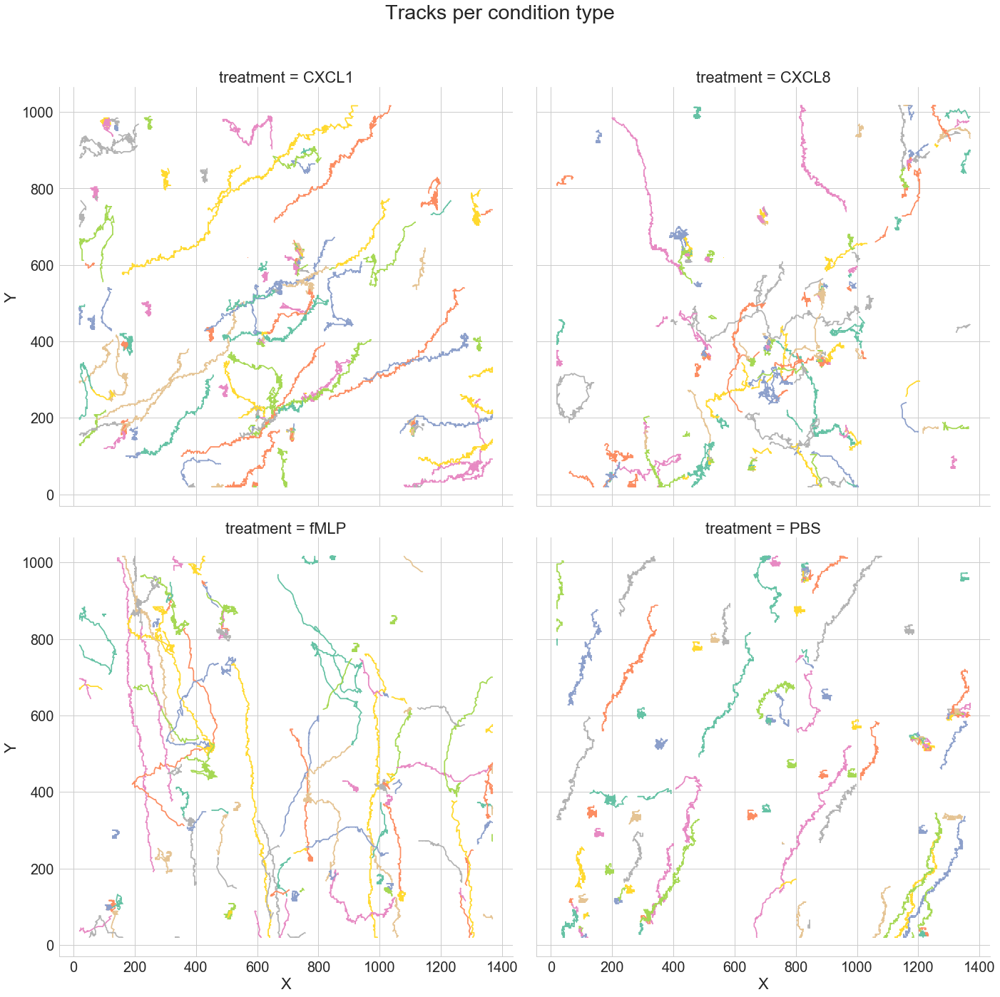

In [45]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="751"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

Patient 805 (mild)

Text(0.5,0.98,'Tracks per condition type')

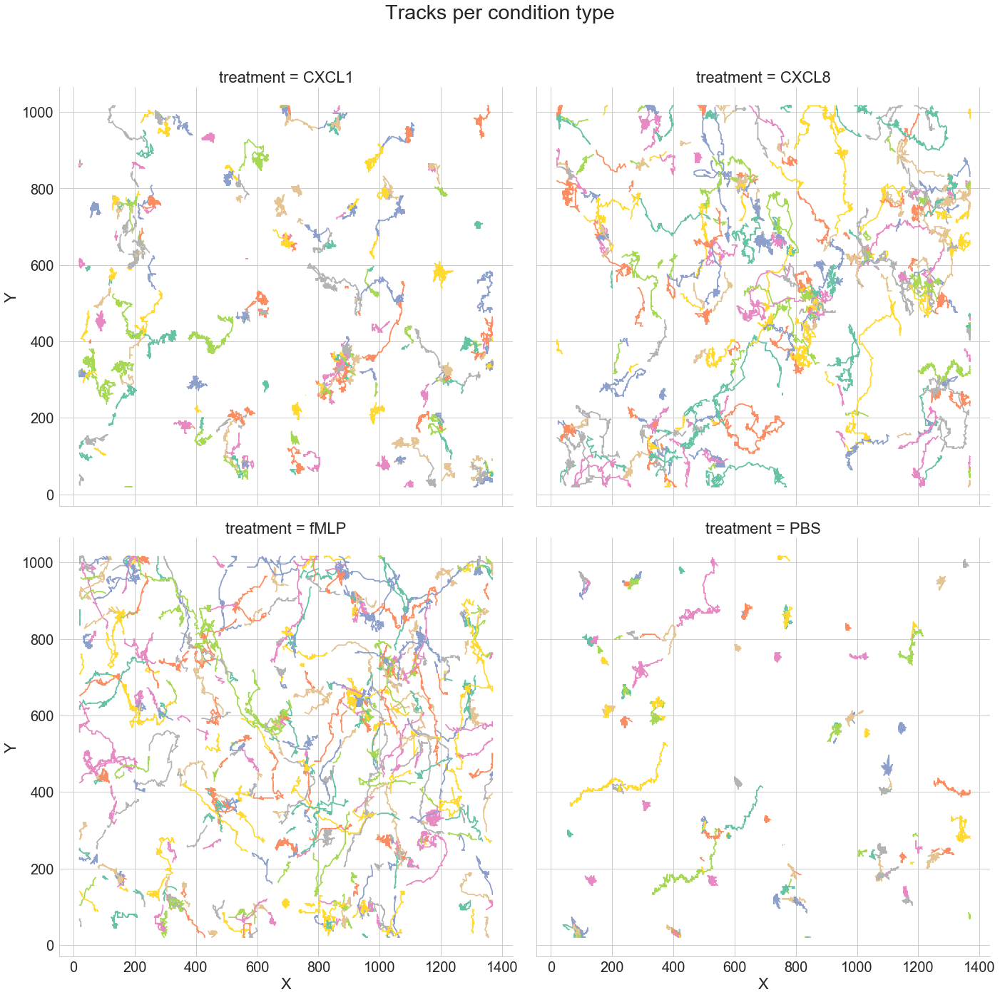

In [46]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="805"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

Patient 858 (mild)

Text(0.5,0.98,'Tracks per condition type')

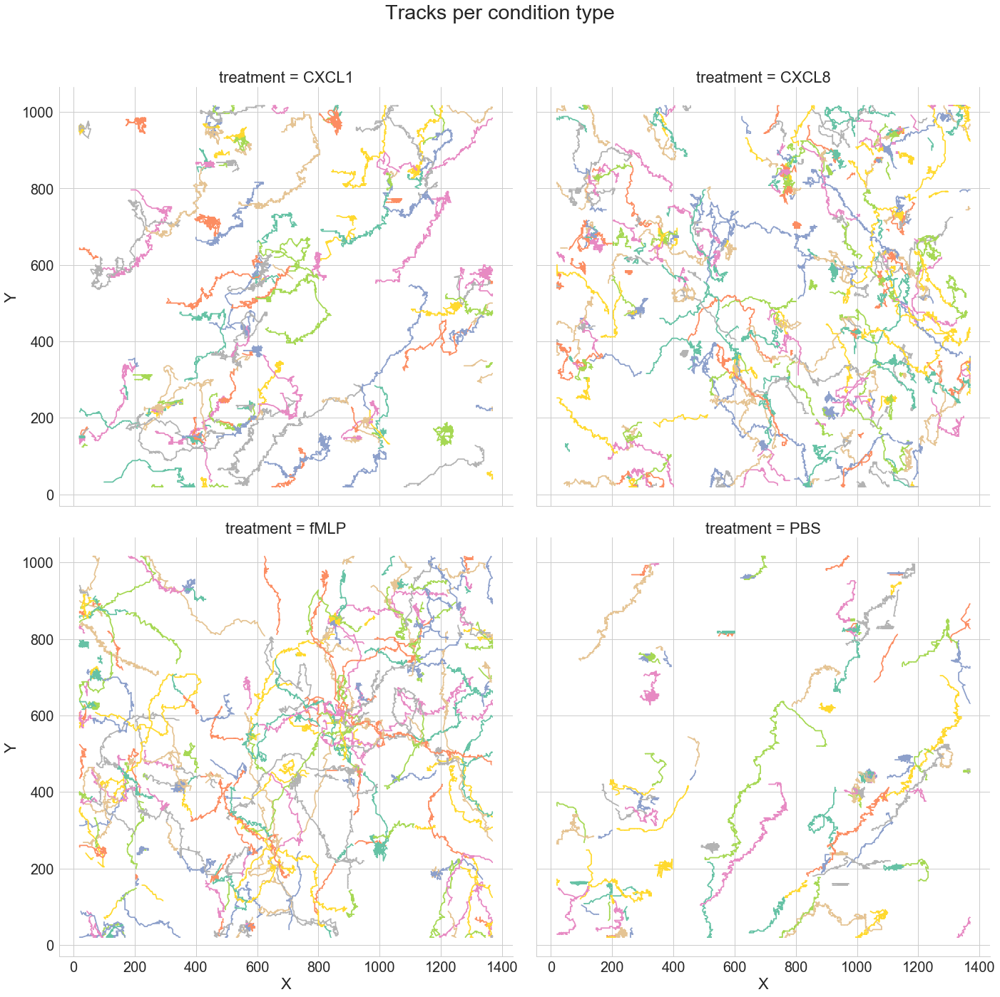

In [47]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="858"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

Patient 859 (mild)

Text(0.5,0.98,'Tracks per condition type')

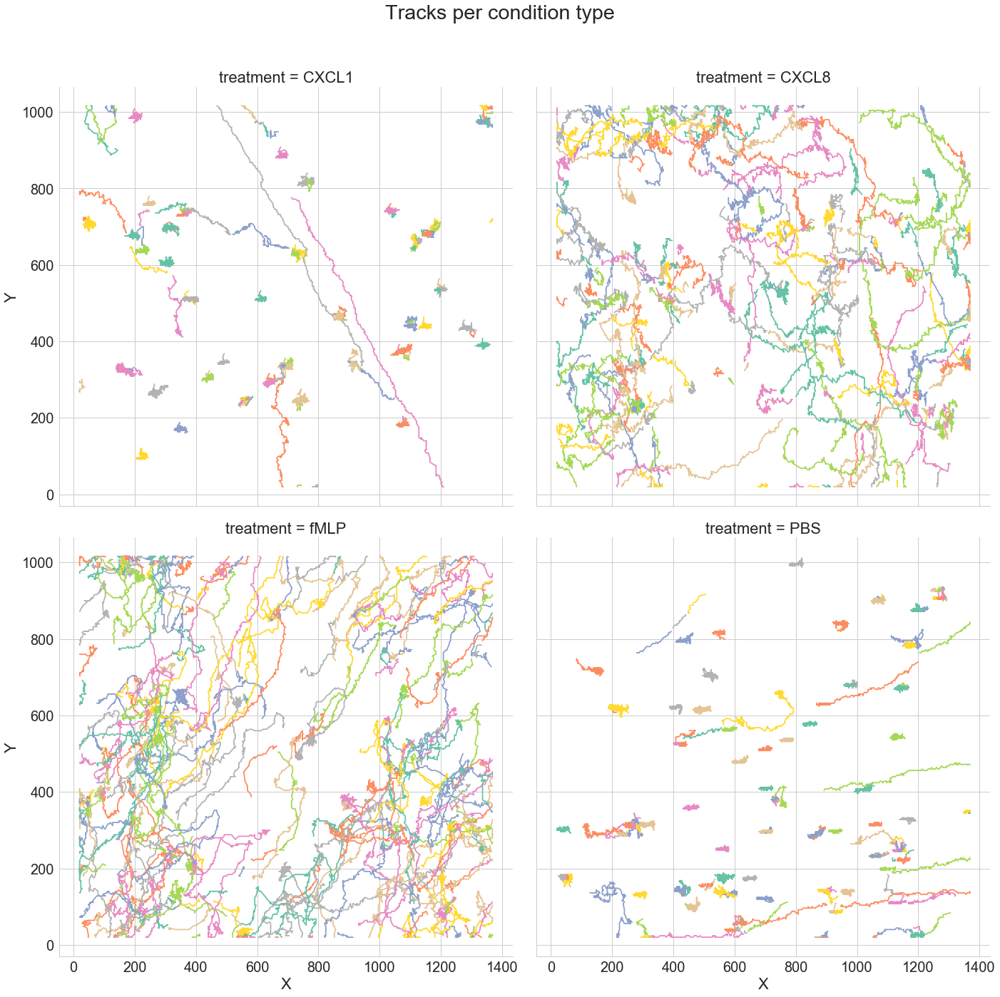

In [48]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(dftracks[dftracks["patientnumber"]=="859"], col="treatment", size = 10, col_wrap = 2, hue="Track_N", palette = 'Set2')
# info over facetgrid: https://seaborn.pydata.org/generated/seaborn.FacetGrid.html
grid.map(plt.plot, 'X', 'Y', marker = "o", ms=1)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Tracks per condition type')

# Rose plots per patient en per treatment

For rose plots, tracks need to be normalised to the origin of the coordinate system:

In [7]:
list_ = []
for patient in dftracks.patientnumber.unique():
    print('current patient: {}'.format(patient))
    tmp3 = dftracks[dftracks.patientnumber==patient]
    for treatment in tmp3.treatment.unique():
        print('current condition: {}'.format(treatment))
        tmp = tmp3[tmp3.treatment==treatment] #tijdelijke dataframes maken per celltype treatment; deze moet je niet opslaan, want je hebt ze daarna niet meer nodig
        for track in tmp.Track_N.unique():
       
            tmp2 = tmp[tmp.Track_N==track]
            array = tmp2.drop(['Track_N', 'Time_Sample_N', 'treatment', 'patientnumber', 'status'], axis=1).as_matrix() #alle info die niet nodig is, smijt je eruit weg
            #je wilt alle lijntjes = tracks plotten in de roseplots
            #je wilt hiervoor telkens vergelijken met de vorige stap: constant bij de volgende stap je baseren op de vorige stap totdat track af is
            diff_array = np.subtract(array, array[0]) #nulmatrix van de coördinaten aftrekken omdat je uit de oorsprong moet beginnen in een RosePlot #dubbele haakjes zijn nodig om er array van te maken
            diff_df = pd.DataFrame(diff_array, columns = ['norm_x', 'norm_y'])
            list_.append(diff_df)  

current patient: 122
current condition: CXCL1


C:\Users\ninad\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  # This is added back by InteractiveShellApp.init_path()


current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 129
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 164
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 714
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 722
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 751
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 805
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 858
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current condition: PBS
current patient: 859
current condition: CXCL1
current condition: CXCL8
current condition: fMLP
current

In [8]:
tracks_norm = pd.concat(list_)
print(tracks_norm)
#Concatenate pandas objects along a particular axis with optional set logic along the other axes.
#Can also add a layer of hierarchical indexing on the concatenation axis, which may be useful if the labels are the same (or overlapping) on the passed axis number.
tracks_norm = tracks_norm.assign(track_id=dftracks.Track_N.values, t=dftracks.Time_Sample_N.values, x=dftracks.X.values, y=dftracks.Y.values,
                                cellType_treatment=dftracks.treatment.values, patientnumber=dftracks.patientnumber.values);
#assign: nieuwe kolommen aan een dataframe toevoegen; print dan nieuwe dataframe met de oude en de nieuwe kolommen samen
print(tracks_norm.head())

    norm_x  norm_y
0        0       0
1        4      -4
2        4       0
3       16     -16
4       12     -12
5       16     -16
6       16     -12
7       16      -8
8       24     -16
9       24     -16
10      28     -24
11      28     -24
12      32     -24
13      28     -16
14      32     -24
15      40     -32
16      36     -32
17      36     -32
18      32     -28
19      32     -32
20      28     -32
21      32     -32
0        0       0
1        0      -4
2        0      -4
3       -4      -4
4       -4      -8
5       -8     -16
6       -4     -16
7      -16     -20
..     ...     ...
8      -20      -4
9      -20      -4
10     -20      -4
11     -20       0
12     -24      -4
13     -24      -4
14     -28      -4
15     -32      -4
0        0       0
1       -4      -4
2       -8       0
3      -12       0
4       -4     -20
5       -4     -20
6       -4     -20
7       -4     -20
8       -4     -20
9       -4     -16
10      -8     -20
11      -8     -20
12     -12  

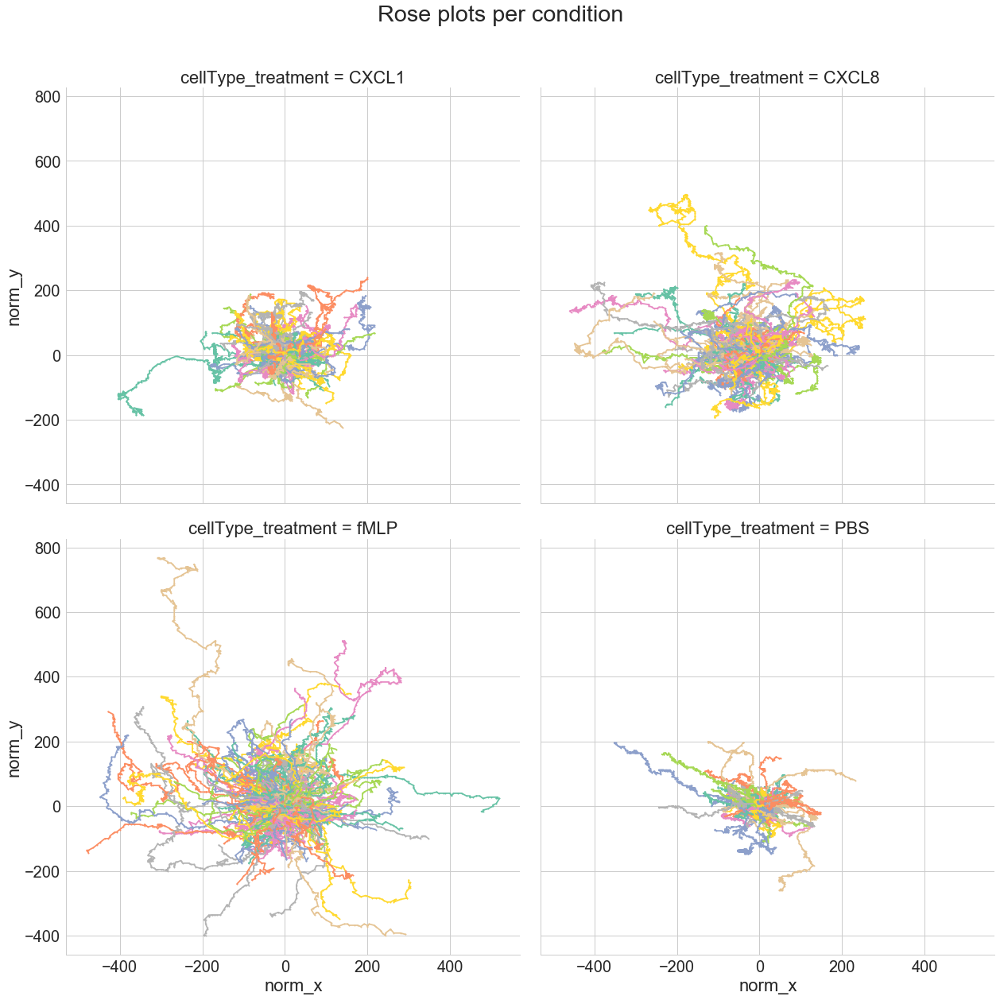

In [9]:
sns.set(style="whitegrid", font_scale=2)
grid = sns.FacetGrid(tracks_norm[tracks_norm["patientnumber"] == "122"], col='cellType_treatment', hue='track_id', col_wrap = 2, size=9, palette='Set2')
grid.map(plt.plot, 'norm_x', 'norm_y', marker="o", ms=2)
plt.subplots_adjust(top=0.9)
grid.fig.suptitle('Rose plots per condition');

patientnumber 122
patientnumber 129
patientnumber 164
patientnumber 714
patientnumber 722
patientnumber 751
patientnumber 805
patientnumber 858
patientnumber 859


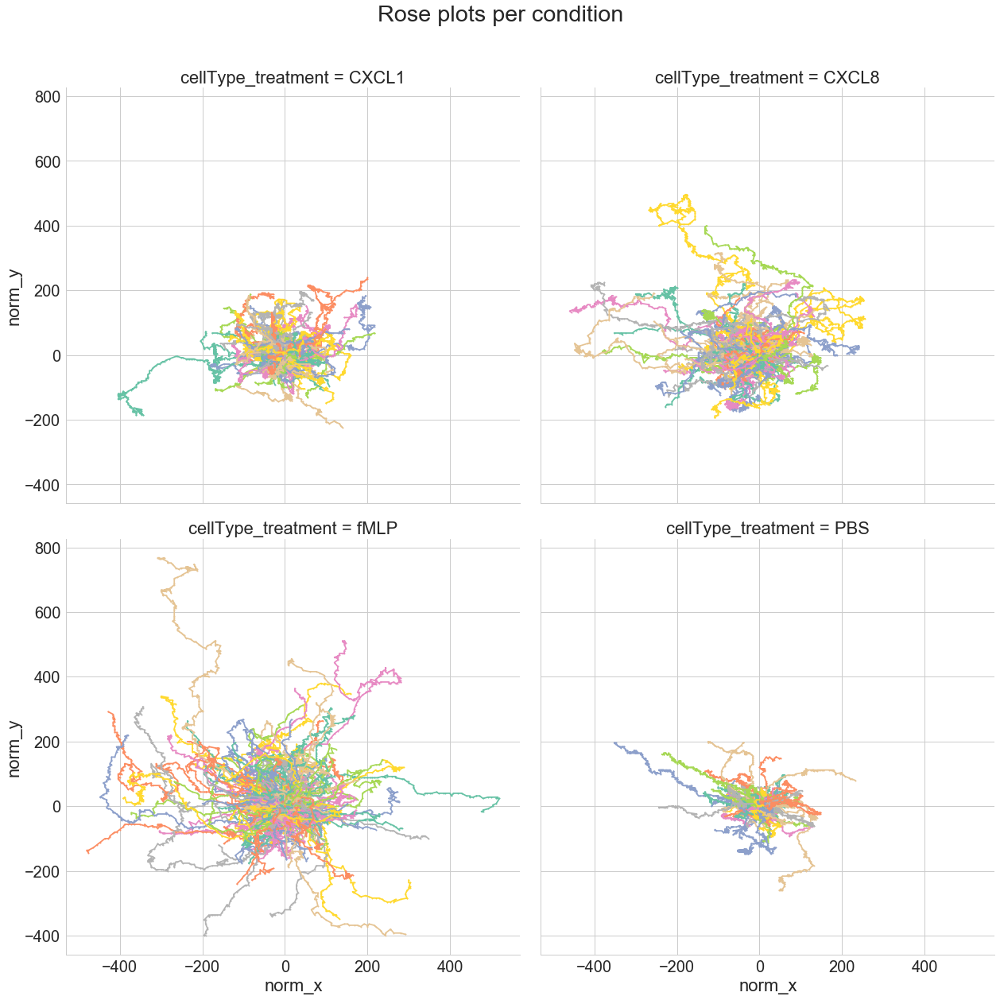

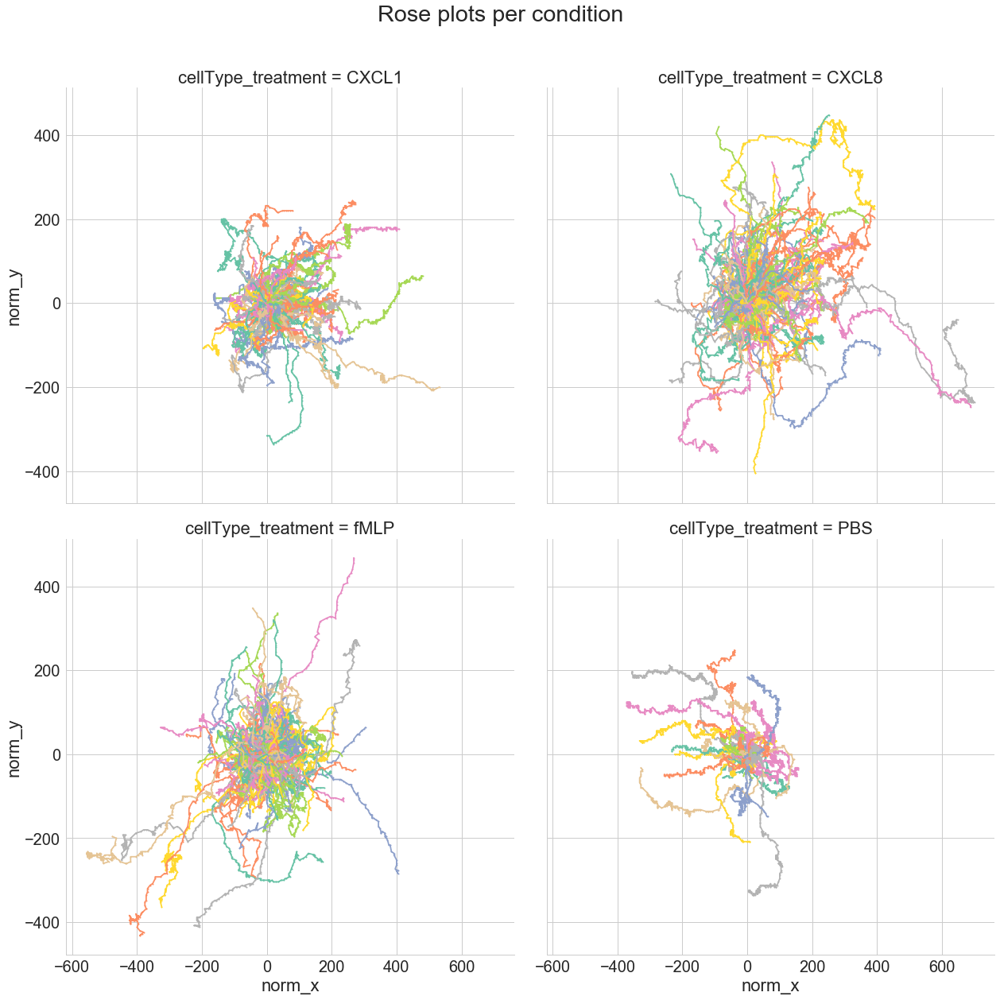

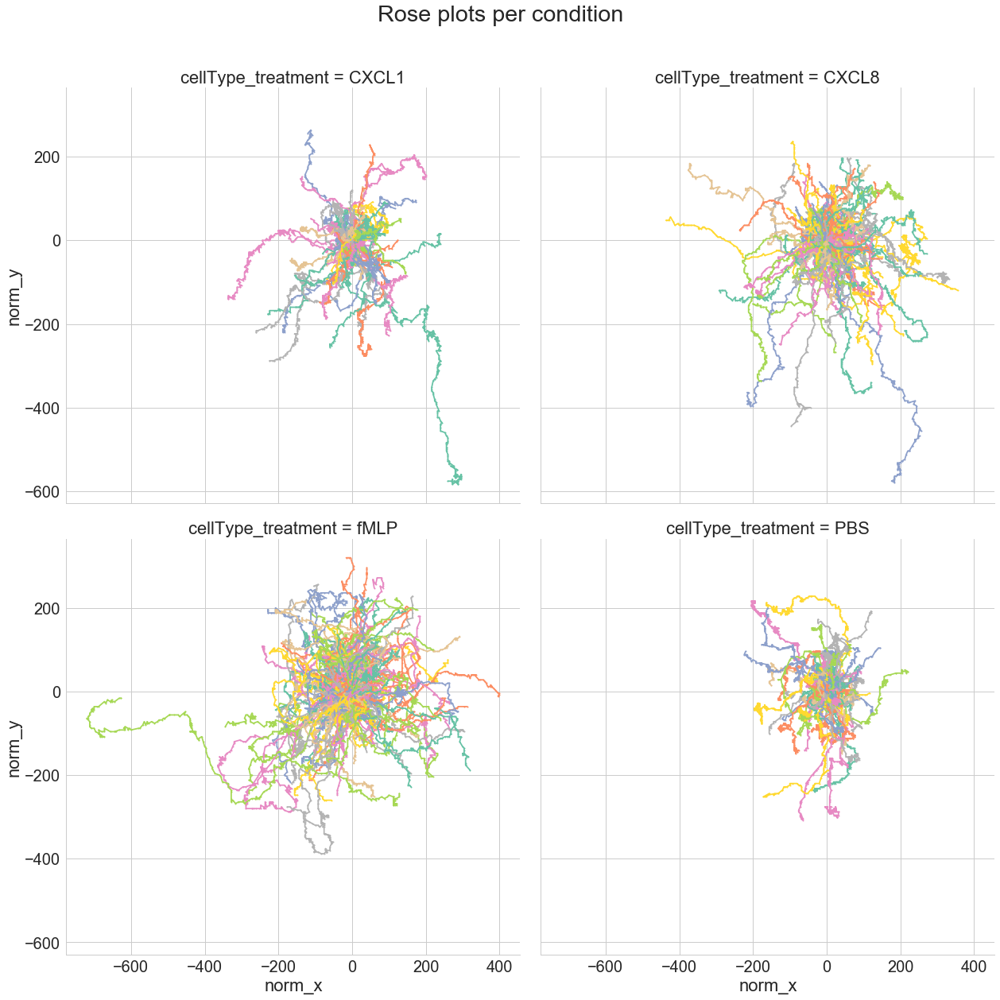

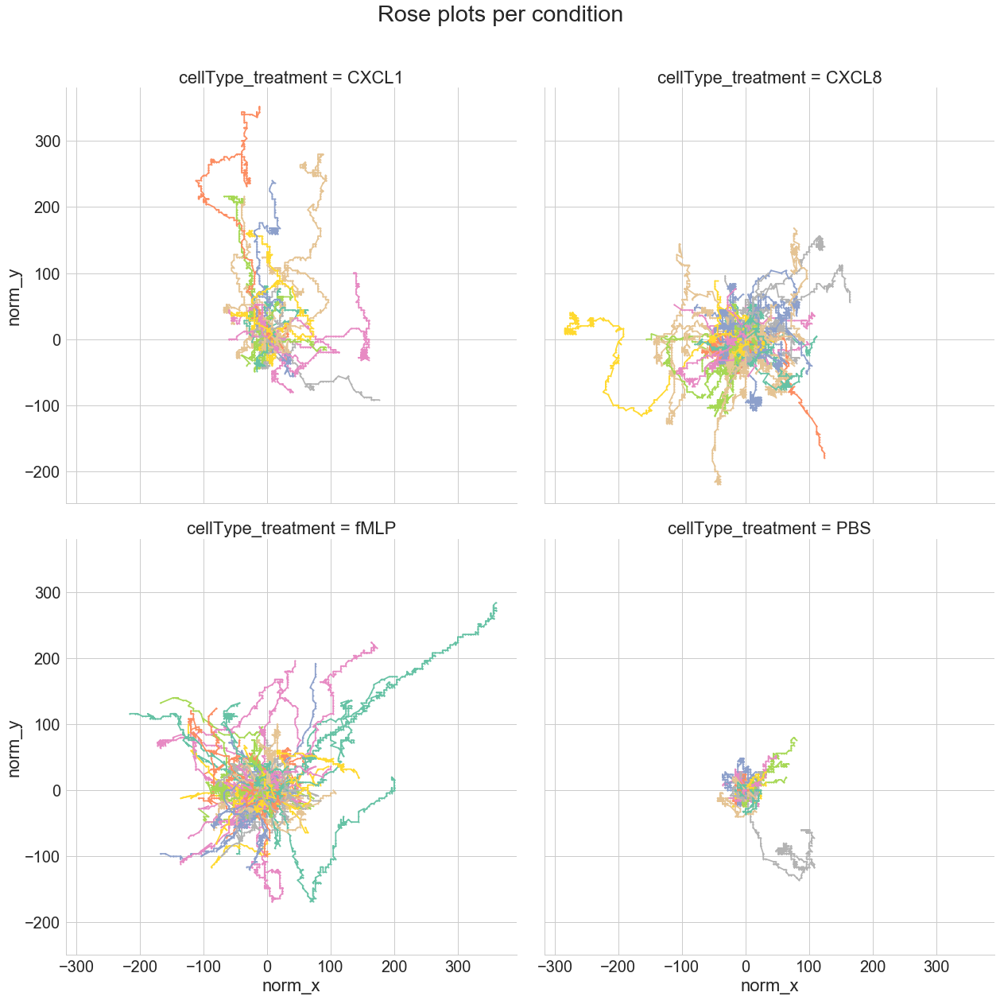

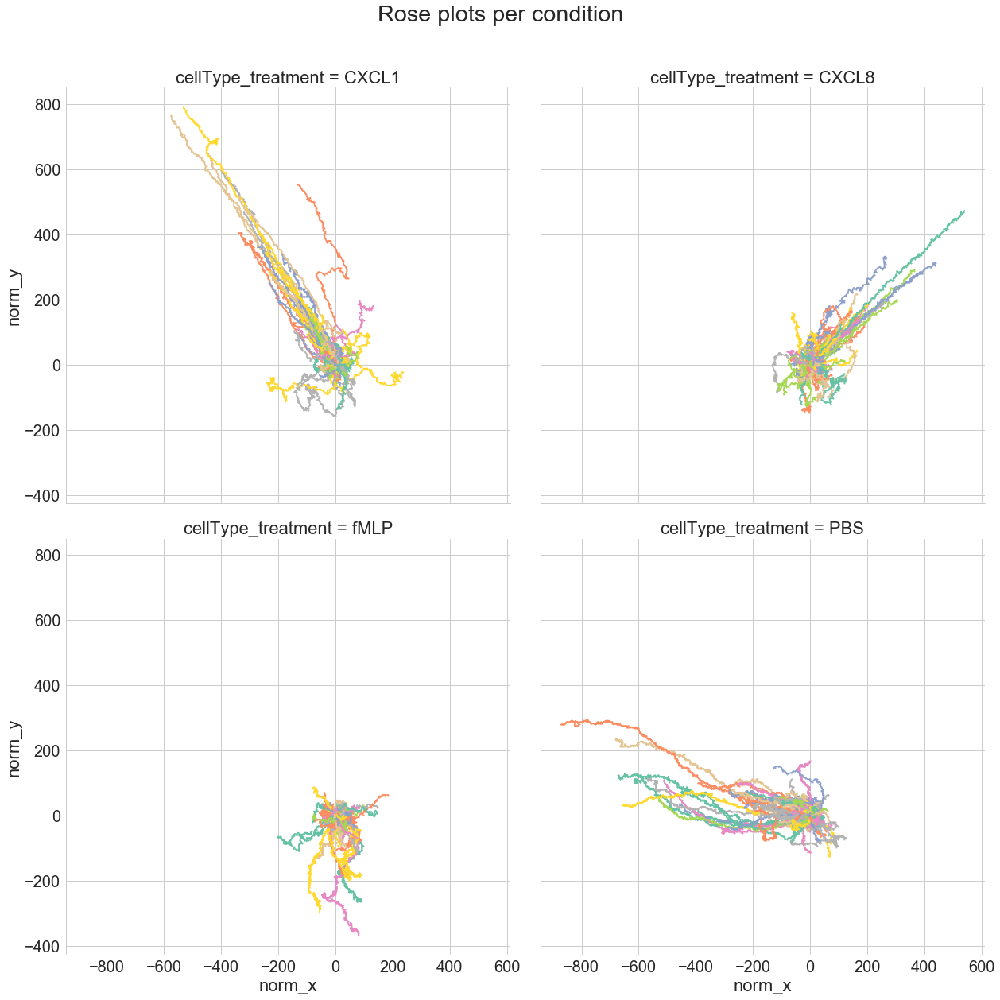

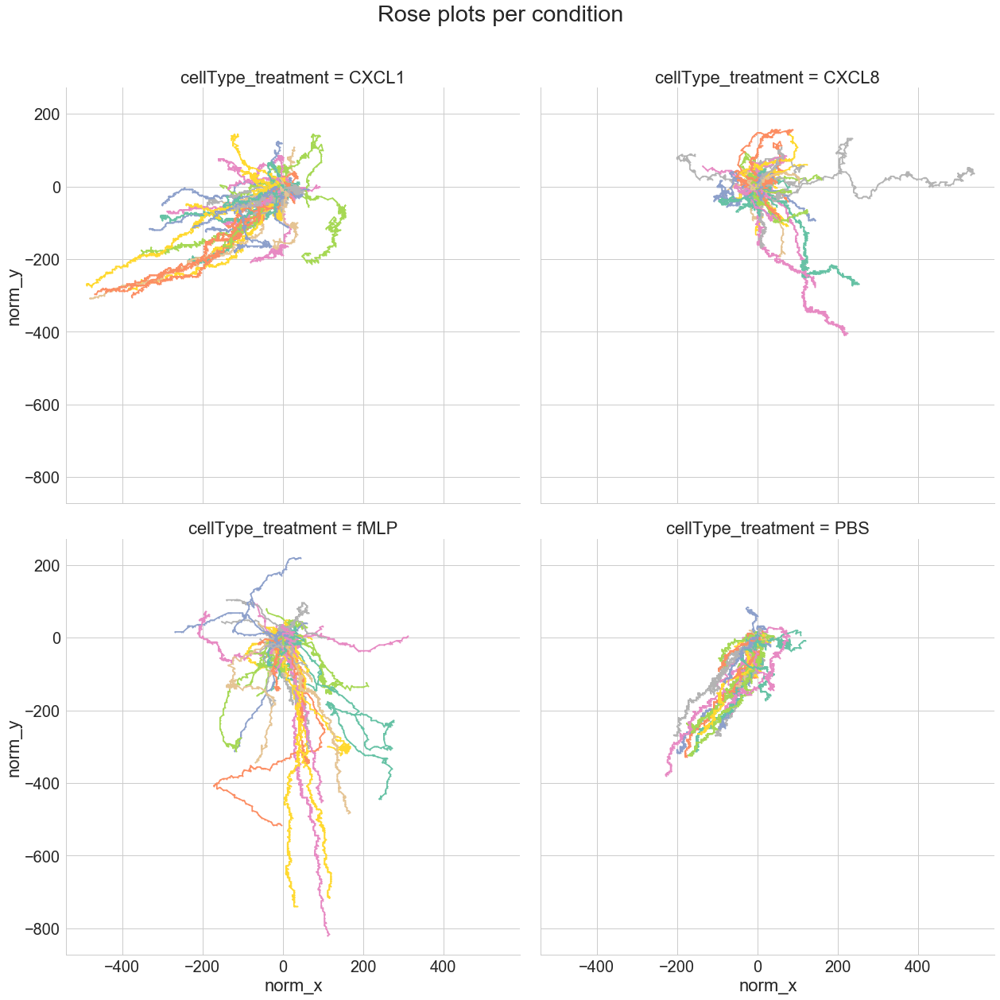

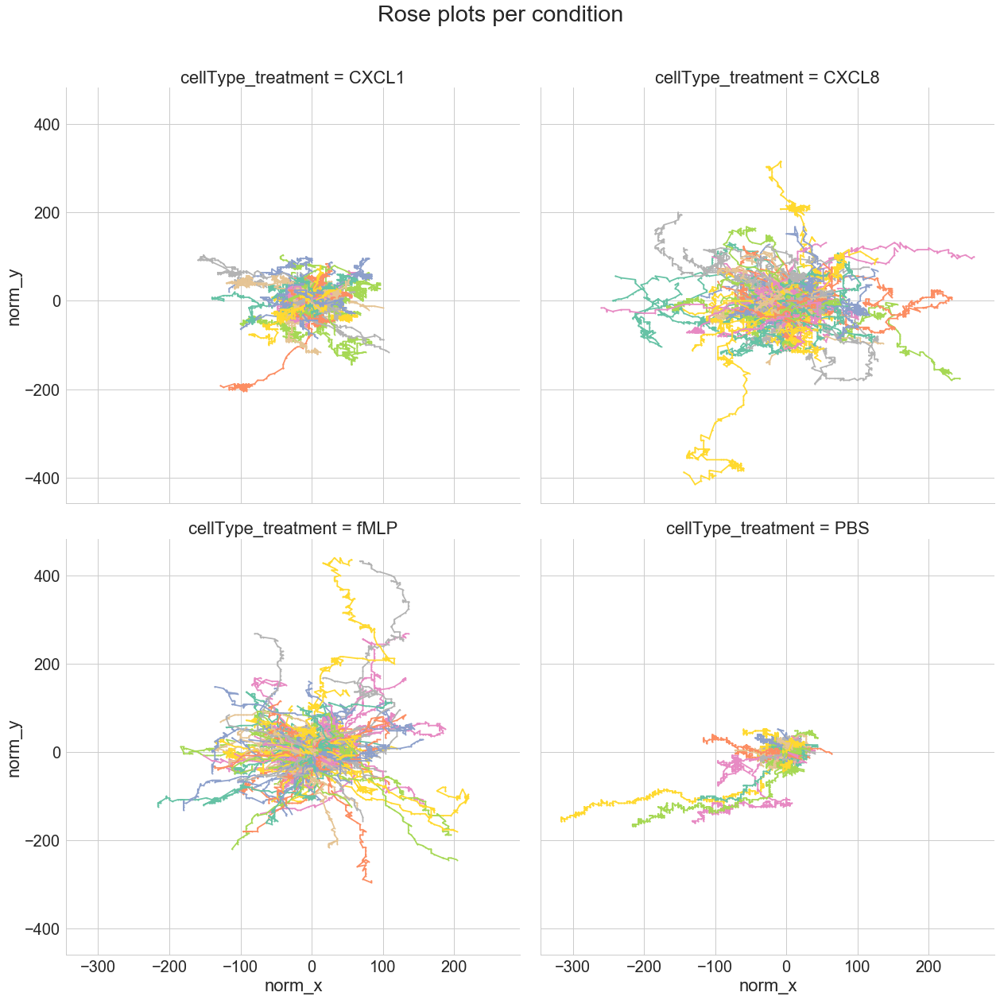

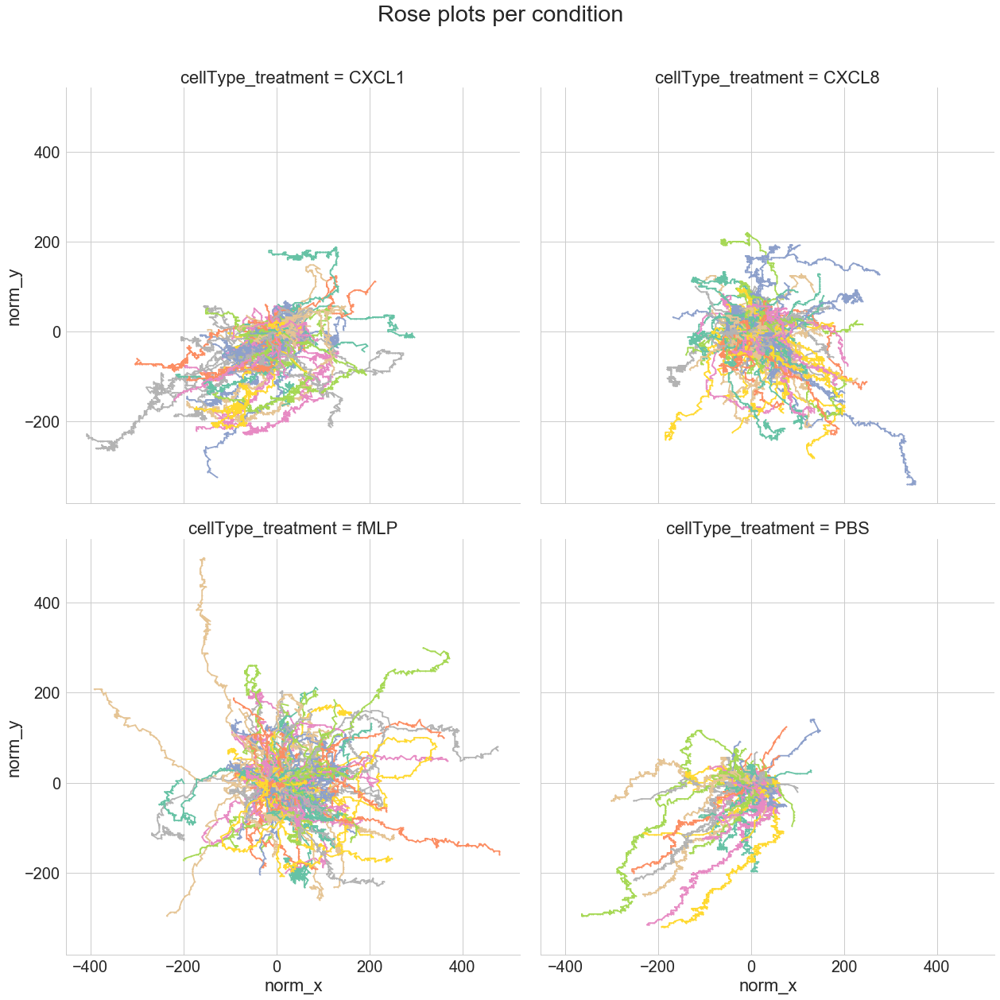

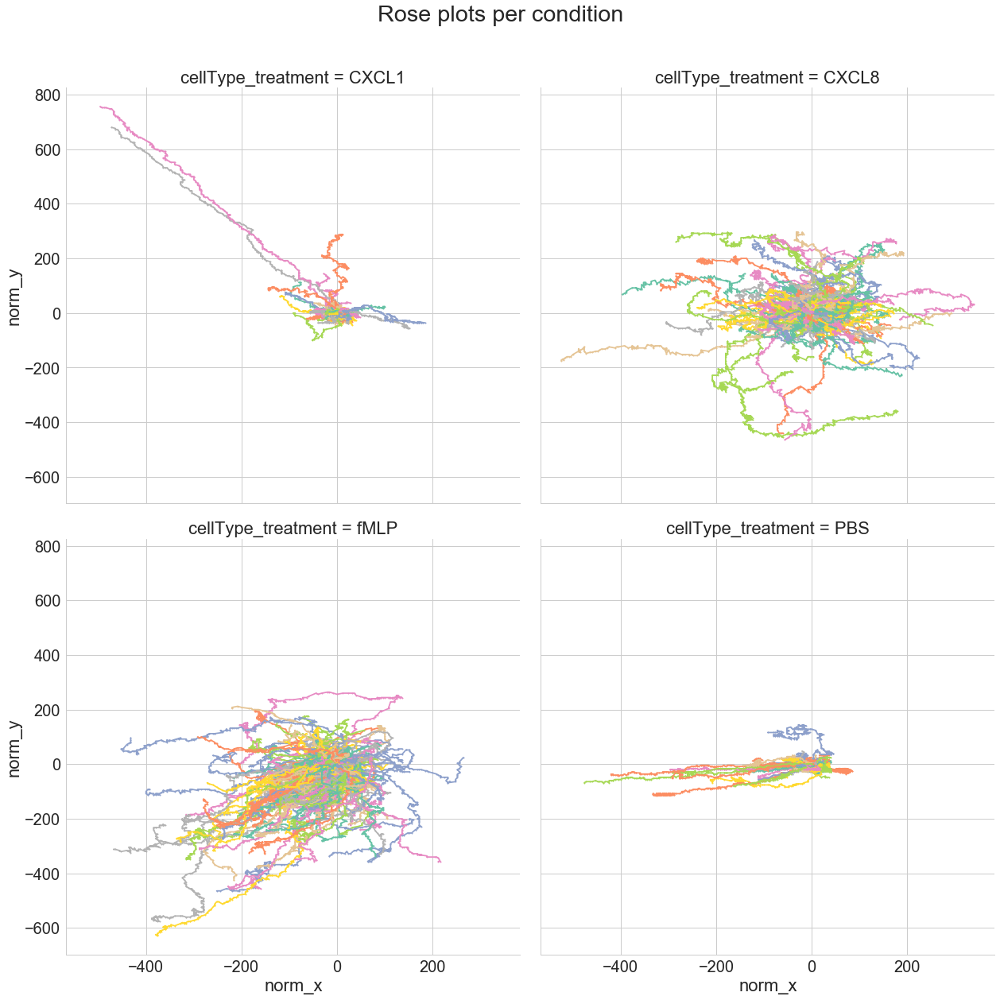

In [12]:
for element in dftracks.patientnumber.unique():
    sns.set(style="whitegrid", font_scale=2)
    grid = sns.FacetGrid(tracks_norm[tracks_norm["patientnumber"] == element], col='cellType_treatment', hue='track_id', col_wrap = 2, size=9, palette='Set2')
    grid.map(plt.plot, 'norm_x', 'norm_y', marker="o", ms=2)
    plt.subplots_adjust(top=0.9)
    print("patientnumber", element)
    grid.fig.suptitle('Rose plots per condition');